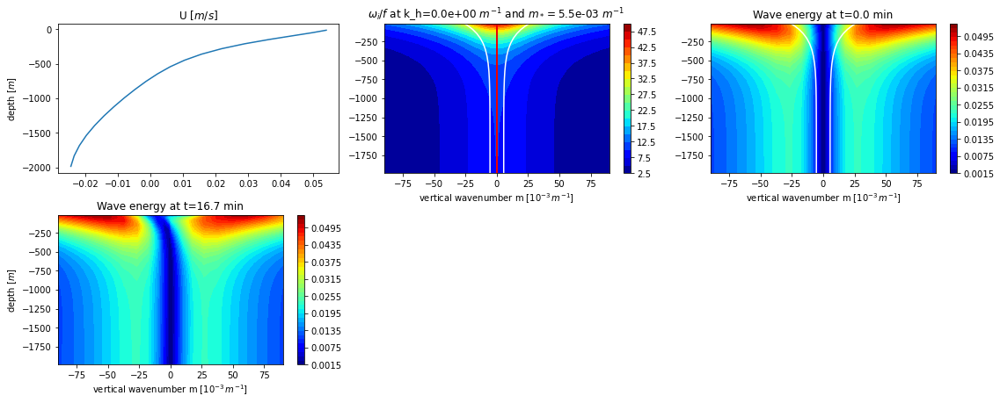

In [2]:
import numpy as np
import pylab as plt


from netCDF4 import Dataset as NF

plt.rcParams['image.cmap'] = 'jet'


ifid=NF('snap6D.cdf',mode='r')
E = ifid.variables['E'][:]
meanfl = ifid.variables['meanfl'][:]
om = ifid.variables['omega_i'][:]
mdot = ifid.variables['mdot'][:]
zdot = ifid.variables['zdot'][:]
xt = ifid.variables['xt'][:]
yt = ifid.variables['yt'][:]
zt = ifid.variables['zt'][:]
kt = ifid.variables['kt'][:]
lt = ifid.variables['lt'][:]
mt = ifid.variables['mt'][:]

dxt = ifid.variables['dxt'][:]
dyt = ifid.variables['dyt'][:]
dzt = ifid.variables['dzt'][:]
dkt = ifid.variables['dkt'][:]
dlt = ifid.variables['dlt'][:]
dmt = ifid.variables['dmt'][:]

ifid.close()

DMT,DLT,DKT,DZT,DYT,DXT = np.meshgrid(dmt,dlt,dkt,dzt,dyt,dxt,indexing='ij')


ifid=NF('snap3D.cdf',mode='r')

k_fixed = ifid.k_fixed
f0 = ifid.f0

U = ifid.variables['U'][:]
Nsqr = ifid.variables['Nsqr'][:]
t = ifid.variables['Time'][:]
meanfl_int = ifid.variables['meanfl'][:]
diss_ks   =  ifid.variables['diss_ks'][:]
diss_ke   =  ifid.variables['diss_ke'][:]
diss_ls   =  ifid.variables['diss_ls'][:]
diss_le   =  ifid.variables['diss_le'][:]
diss_ms   =  ifid.variables['diss_ms'][:]
diss_me   =  ifid.variables['diss_me'][:]
ifid.close()


diss = diss_ke-diss_ks
diss += diss_le-diss_ls
diss += diss_me-diss_ms


jstar = 5.
cs = np.sum( np.sqrt(Nsqr)*DZT[0,0,0,:,:,:], axis = 0)/np.pi/jstar
ms = np.sqrt(Nsqr)/cs[np.newaxis,:,:]
ms = np.mean(np.mean(ms,axis=2),axis=1)

x,y=0,0

plt.figure(figsize=(16,9),tight_layout=True)


ax = plt.subplot(3,3,1)
ax.plot(U[:,y,x],zt   ) 
ax.set_title('U [$m/s$]')
ax.set_ylabel('depth [$m$]')

ax = plt.subplot(3,3,2)
om[ om<1e-4 ] = np.nan
co = plt.contourf(mt*1e3,zt, om[:,0,0,:,0,0].T/f0,20)#,colors='k') 
plt.colorbar(co)
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')
ax.plot(-k_fixed*1e3+ms*0,zt,'k')
ax.plot(+k_fixed*1e3+ms*0,zt,'k')
ax.plot(-30*k_fixed*1e3+ms*0,zt,'r')
ax.plot(+30*k_fixed*1e3+ms*0,zt,'r')
 
ax.set_title('$\omega_i/f$ at k_h=%2.1e $m^{-1}$ and $m_*=$%2.1e $m^{-1}$ '%(k_fixed,ms[0]))
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

col = 40#np.arange(0.0003,0.0005,0.00001)

ax = plt.subplot(3,3,3)
#co = plt.contourf(kt,lt, np.sum(meanfl[:,:,:,12,0,0]*DMT[:,:,:,9,0,0],axis=0)) 
#co = plt.contourf(lt,mt,np.log10( np.sum(E0[:,:,:,12,0,0]*DKT[:,:,:,9,0,0],axis=2) ) ) 
#a = np.sum(np.sum(E0*DKT*DLT,axis=2),axis=1) 
co = plt.contourf(mt*1e3,zt, E[0,:,0,0,:,0,0].T,col) 
#co = plt.contourf(mt*1e3,zt, zdot[:,0,0,:,0,0].T) 
plt.colorbar(co)
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')        
ax.set_title('Wave energy at t=%3.1f min'%(t[0],))
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>1:
 ax = plt.subplot(3,3,4)
 co = plt.contourf(mt*1e3,zt,E[1,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[1]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>10:
 ax = plt.subplot(3,3,5)
 co = plt.contourf(mt*1e3,zt,E[10,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[10]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>20:
 ax = plt.subplot(3,3,6)
 co = plt.contourf(mt*1e3,zt,E[20,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[20]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>30:
 ax = plt.subplot(3,3,7)
 co = plt.contourf(mt*1e3,zt,E[30,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[30]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')


if t.shape[0]>100:
 ax = plt.subplot(3,3,8)
 co = plt.contourf(mt*1e3,zt,E[99,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[99]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')



if t.shape[0]>150:
 ax = plt.subplot(3,3,9)
 co = plt.contourf(mt*1e3,zt,E[-1,:,0,0,:,0,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[-1]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')


#plt.savefig('tmp.png')
plt.show()

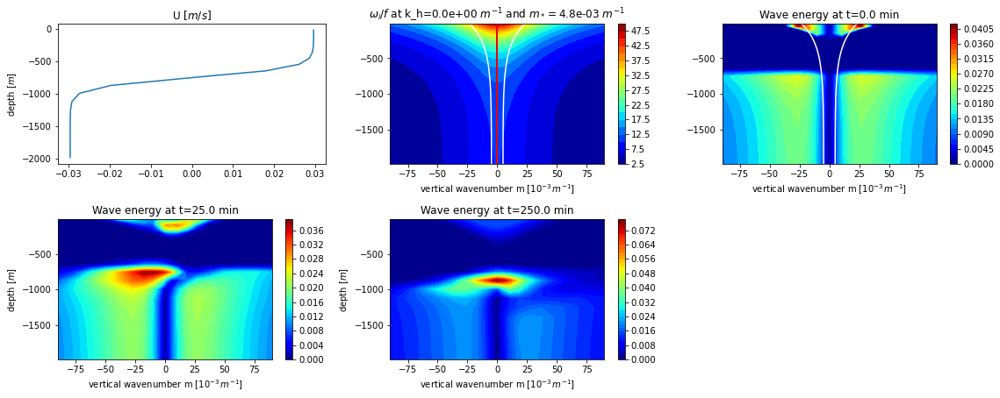

In [159]:

x,y=0,0

plt.figure(figsize=(16,9),tight_layout=True)


ax = plt.subplot(3,3,1)
ax.plot(U[:,y,x],zt   ) 
ax.set_title('U [$m/s$]')
ax.set_ylabel('depth [$m$]')

ax = plt.subplot(3,3,2)
om[ om<1e-4 ] = np.nan
co = plt.contourf(mt*1e3,zt, om[:,0,0,:,0,0].T/f0,20)#,colors='k') 
plt.colorbar(co)
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')
ax.plot(-k_fixed*1e3+ms*0,zt,'k')
ax.plot(+k_fixed*1e3+ms*0,zt,'k')
ax.plot(-30*k_fixed*1e3+ms*0,zt,'r')
ax.plot(+30*k_fixed*1e3+ms*0,zt,'r')
 
ax.set_title('$\omega_i/f$ at k_h=%2.1e $m^{-1}$ and $m_*=$%2.1e $m^{-1}$ '%(k_fixed,ms[0]))
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

col = 40#np.arange(0.0003,0.0005,0.00001)

y=3

ax = plt.subplot(3,3,3)
#co = plt.contourf(kt,lt, np.sum(meanfl[:,:,:,12,0,0]*DMT[:,:,:,9,0,0],axis=0)) 
#co = plt.contourf(lt,mt,np.log10( np.sum(E0[:,:,:,12,0,0]*DKT[:,:,:,9,0,0],axis=2) ) ) 
#a = np.sum(np.sum(E0*DKT*DLT,axis=2),axis=1) 
co = plt.contourf(mt*1e3,zt, E[0,:,0,0,:,y,0].T,col) 
#co = plt.contourf(mt*1e3,zt, zdot[:,0,0,:,0,0].T) 
plt.colorbar(co)
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')        
ax.set_title('Wave energy at t=%3.1f min'%(t[0],))
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>1:
 ax = plt.subplot(3,3,4)
 co = plt.contourf(mt*1e3,zt,E[1,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[1]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>10:
 ax = plt.subplot(3,3,5)
 co = plt.contourf(mt*1e3,zt,E[10,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[10]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>20:
 ax = plt.subplot(3,3,6)
 co = plt.contourf(mt*1e3,zt,E[20,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[20]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')

if t.shape[0]>30:
 ax = plt.subplot(3,3,7)
 co = plt.contourf(mt*1e3,zt,E[30,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[30]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')


if t.shape[0]>100:
 ax = plt.subplot(3,3,8)
 co = plt.contourf(mt*1e3,zt,E[99,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[99]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')



if t.shape[0]>150:
 ax = plt.subplot(3,3,9)
 co = plt.contourf(mt*1e3,zt,E[-1,:,0,0,:,y,0].T,col) 
 plt.colorbar(co)
 ax.set_title('Wave energy at t=%3.1f min'%(t[-1]/60,))
 ax.set_ylabel('depth [$m$]')         
 ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')


plt.show()

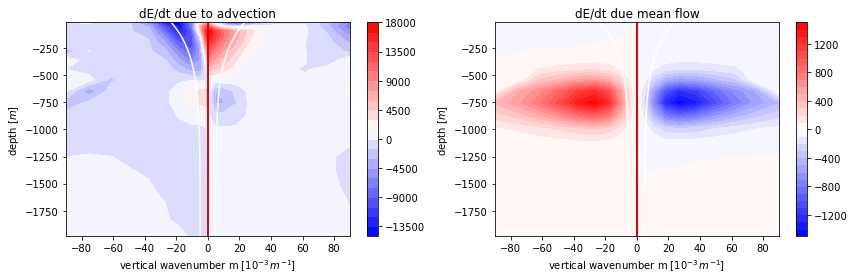

In [160]:
dE = (E[1,...]- E[0,...])/(t[1]-t[0])

plt.rcParams['image.cmap'] = 'bwr'

dE_adv = dE + meanfl[0,...]
plt.figure(figsize=(12,4),tight_layout=True)

col = np.arange(-10,10,0.5)
ax = plt.subplot(1,2,1)
#co = plt.contourf(mt*1e3,zt,np.clip( dE_adv[:,0,0,:,0,0].T*1e9,30, col[0],col[-1]),col)
co = plt.contourf(mt*1e3,zt, dE_adv[:,0,0,:,0,0].T*1e9,30)#, col[0],col[-1]),col)

plt.colorbar(co)
ax.set_title('dE/dt due to advection')
ax.set_ylabel('depth [$m$]')         
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')
ax.plot(-k_fixed*1e3+ms*0,zt,'k')
ax.plot(+k_fixed*1e3+ms*0,zt,'k')
ax.plot(-30*k_fixed*1e3+ms*0,zt,'r')
ax.plot(+30*k_fixed*1e3+ms*0,zt,'r')

ax = plt.subplot(1,2,2)
co = plt.contourf(mt*1e3,zt,np.clip(  -meanfl[0,:,0,0,:,0,0].T*1e9, col[0],col[-1]) ,col)
co = plt.contourf(mt*1e3,zt,  -meanfl[0,:,0,0,:,0,0].T*1e9,30)

plt.colorbar(co)
ax.set_title('dE/dt due mean flow')
ax.set_ylabel('depth [$m$]')         
ax.set_xlabel('vertical wavenumber m [$10^{-3} \, m^{-1}$]')
ax.plot(-ms*1e3,zt,'w')
ax.plot(+ms*1e3,zt,'w')
ax.plot(-k_fixed*1e3+ms*0,zt,'k')
ax.plot(+k_fixed*1e3+ms*0,zt,'k')
ax.plot(-30*k_fixed*1e3+ms*0,zt,'r')
ax.plot(+30*k_fixed*1e3+ms*0,zt,'r')

plt.savefig('tmp.png')
plt.show()

### My Plots and Video

In [3]:
import xarray as xr
import numpy as np
import pylab as plt

data6D=xr.open_dataset("snap6D.cdf")

In [4]:
data3D=xr.open_dataset("snap3D.cdf")

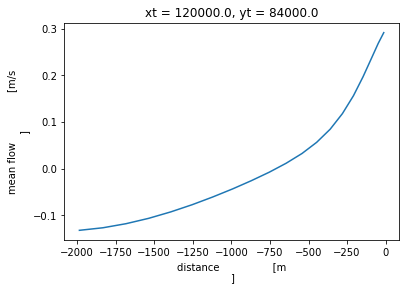

In [14]:
data3D.U[:,3].plot()

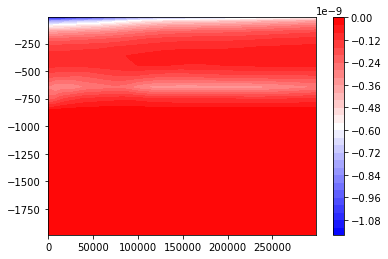

In [325]:
plt.contourf(data3D.Time,data3D.zt,data3D.diss_ms[:,:,8,0].T, 30)
plt.colorbar()

<ipython-input-369-71ae625f9640>:1: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(data3D.yt,data3D.zt,data3D.diss_me[-1,:,:,0])


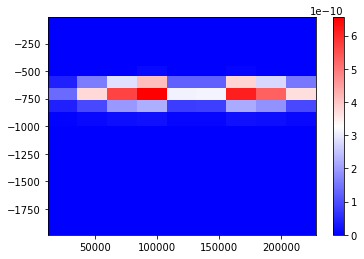

In [369]:
plt.pcolormesh(data3D.yt,data3D.zt,data3D.diss_me[-1,:,:,0])
plt.colorbar()

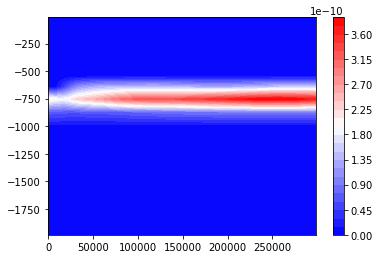

In [327]:
plt.contourf(data3D.Time,data3D.zt,data3D.diss_me[:,:,8,0].T, 30)
plt.colorbar()

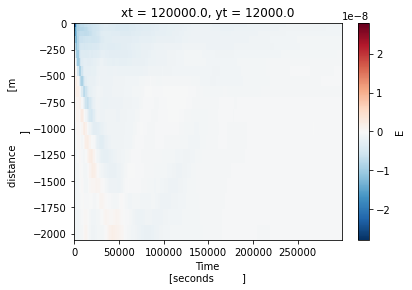

In [328]:
data3D.E[:,:,0,0].differentiate("Time").T.plot()

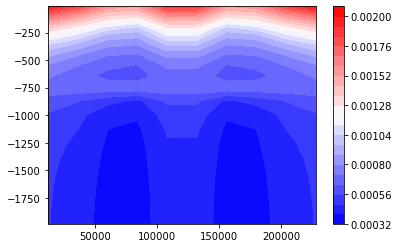

In [338]:
plt.contourf(data3D.yt,data3D.zt,data3D.E[0,:,:,0],levels=20)
plt.colorbar()

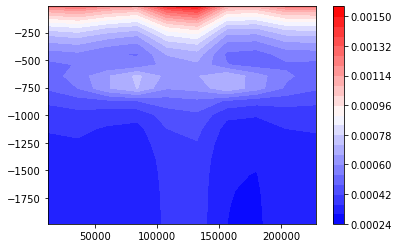

In [388]:
plt.contourf(data3D.yt,data3D.zt,data3D.E[-1,:,:,0],levels=20)
plt.colorbar()

<ipython-input-370-a76d82bea429>:1: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(data3D.yt,data3D.zt,data3D.meanfl[-5,:,:,0])


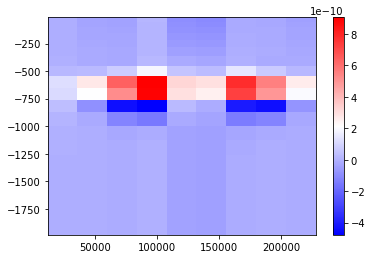

In [370]:
plt.pcolormesh(data3D.yt,data3D.zt,data3D.meanfl[-5,:,:,0])
plt.colorbar()

In [347]:
data3D.close()

In [348]:
data6D

<xarray.Dataset>
Dimensions:  (Time: 200, kt: 20, ku: 20, lt: 20, lu: 20, mt: 20, mu: 20, xt: 1, xu: 1, yt: 10, yu: 10, zt: 20, zu: 20)
Coordinates: (12/13)
  * Time     (Time) float64 0.0 1.5e+03 3e+03 ... 2.955e+05 2.97e+05 2.985e+05
  * xt       (xt) float64 1.2e+05
  * xu       (xu) float64 2.4e+05
  * yt       (yt) float64 1.2e+04 3.6e+04 6e+04 ... 1.8e+05 2.04e+05 2.28e+05
  * yu       (yu) float64 2.4e+04 4.8e+04 7.2e+04 ... 1.92e+05 2.16e+05 2.4e+05
  * zt       (zt) float64 -1.985e+03 -1.832e+03 -1.683e+03 ... -48.33 -12.67
    ...       ...
  * kt       (kt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * ku       (ku) float64 -0.01653 -0.01372 -0.01107 ... 0.01372 0.01653 0.01942
  * lt       (lt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * lu       (lu) float64 -0.01653 -0.01372 -0.01107 ... 0.01372 0.01653 0.01942
  * mt       (mt) float64 -0.08987 -0.0754 -0.06178 ... 0.06178 0.0754 0.08987
  * mu       (mu) float64 -0.08263 -0.06859 -0.05533 ... 0.06859 0.08263 0.09711
Data variables: (12/16)
    dxt      (xu) float64 2.4e+05
    dyt      (yu) float64 2.4e+04 2.4e+04 2.4e+04 ... 2.4e+04 2.4e+04 2.4e+04
    dzt      (zu) float64 152.5 151.0 148.3 144.8 ... 58.22 49.25 40.0 30.5
    dkt      (ku) float64 0.002895 0.002809 0.002652 ... 0.002809 0.002895
    dlt      (lu) float64 0.002895 0.002809 0.002652 ... 0.002809 0.002895
    dmt      (mu) float64 0.01447 0.01404 0.01326 ... 0.01326 0.01404 0.01447
    ...       ...
    ldot     (mt, lu, kt, zt, yt, xt) float64 ...
    mdot     (mu, lt, kt, zt, yt, xt) float64 ...
    omega_i  (mt, lt, kt, zt, yt, xt) float64 ...
    omega_e  (mt, lt, kt, zt, yt, xt) float64 ...
    E        (Time, mt, lt, kt, zt, yt, xt) float64 ...
    meanfl   (Time, mt, lt, kt, zt, yt, xt) float64 ...

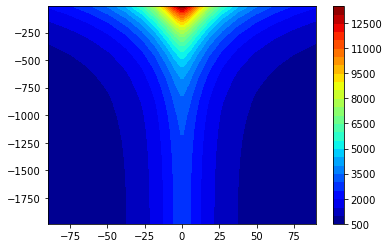

In [349]:
plt.contourf(data6D.mt*1e3,data6D.zt,data6D.omega_e[:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T/1e-4,levels=30,cmap="jet")
plt.colorbar()

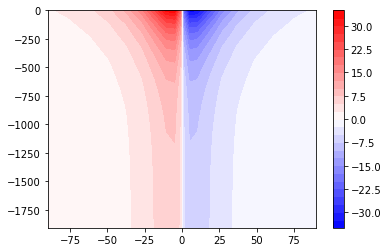

In [350]:
plt.contourf(data6D.mt*1e3,data6D.zu,data6D.zdot[:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T,levels=30,cmap="bwr")
plt.colorbar()

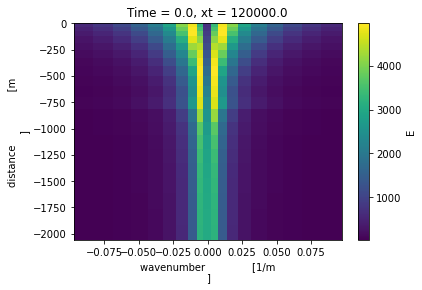

In [351]:
data6D.E[0,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T.plot()

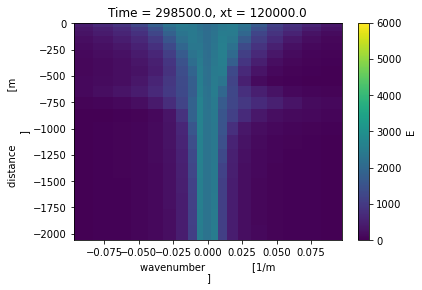

In [352]:
data6D.E[-1,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T.plot(vmin=0, vmax=6000)

Text(0.5, 1.0, '$mdot$')

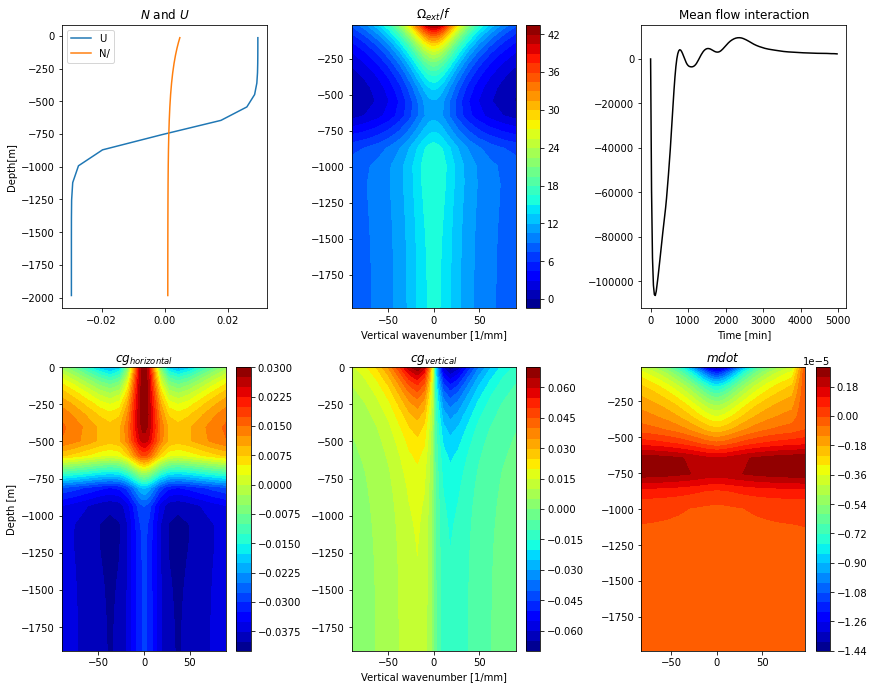

In [353]:
plt.figure(figsize=(20,14),tight_layout=True)
f=1e-4
ax = plt.subplot(3,5,1)
khU=data3D.U[:,0,0]
khU.plot(y="zt",label="U")
N=data3D.Nsqr[:,0,0]**0.5
plt.plot(N,data3D.zt,label="N/")
ax.legend()
ax.set_title("$N$ and $U$")
ax.set_ylabel("Depth[m]")
ax.set_xlabel("")

ax = plt.subplot(3,5,2)
co=plt.contourf(data6D.mt*1e3,data6D.zt,data6D.omega_e[:,0,0,:,0,0].transpose()/1e-4,levels=30,cmap="jet")
plt.colorbar(co)
ax.set_xlabel("Vertical wavenumber [1/mm]")
ax.set_title("$\Omega_{ext}/f$")

ax = plt.subplot(3,5,3)
ax.plot(data3D.Time/60.,data3D.mflint,"k")
ax.set_xlabel("Time [min]")
ax.set_title("Mean flow interaction")

ax = plt.subplot(3,5,6)
co = plt.contourf(data6D.mt*1e3,data6D.zu,data6D.xdot[:,0,0,:,0,0].transpose(),levels=30,cmap="jet")
plt.colorbar(co)
ax.set_ylabel("Depth [m]")
ax.set_title("$cg_{horizontal}$")

ax = plt.subplot(3,5,7)
co = plt.contourf(data6D.mt*1e3,data6D.zu,data6D.zdot[:,0,0,:,0,0].transpose(),levels=30,cmap="jet")
plt.colorbar(co)
ax.set_xlabel("Vertical wavenumber [1/mm]")
ax.set_title("$cg_{vertical}$")

ax = plt.subplot(3,5,8)
co = plt.contourf(data6D.mu*1e3,data6D.zt,data6D.mdot[:,0,0,:,0,0].transpose(),levels=30,cmap="jet")
plt.colorbar(co)
ax.set_title("$mdot$")

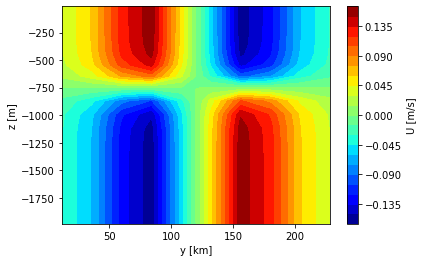

In [354]:
plt.contourf(data3D.yt/1000,data3D.zt,data3D.U[:,:,0], 20, cmap="jet", levels=21)
plt.xlabel("y [km]")
plt.ylabel("z [m]")
plt.colorbar(label="U [m/s]")

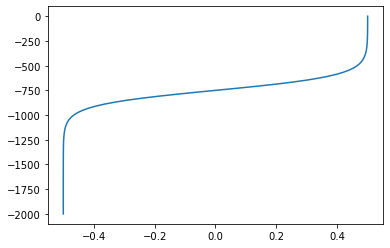

In [355]:
z=np.linspace(-2000,0,100)
plt.plot(((1+np.tanh( (z+750)/150))/(2.))-0.5,z)

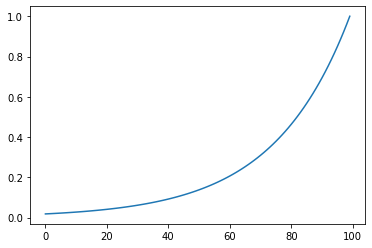

In [356]:
z=np.linspace(-1000,0,100)
plt.plot(np.exp(z/250.) )

In [357]:
data6D.E

<xarray.DataArray 'E' (Time: 200, mt: 20, lt: 20, kt: 20, zt: 20, yt: 10, xt: 1)>
[320000000 values with dtype=float64]
Coordinates:
  * Time     (Time) float64 0.0 1.5e+03 3e+03 ... 2.955e+05 2.97e+05 2.985e+05
  * xt       (xt) float64 1.2e+05
  * yt       (yt) float64 1.2e+04 3.6e+04 6e+04 ... 1.8e+05 2.04e+05 2.28e+05
  * zt       (zt) float64 -1.985e+03 -1.832e+03 -1.683e+03 ... -48.33 -12.67
  * kt       (kt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * lt       (lt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * mt       (mt) float64 -0.08987 -0.0754 -0.06178 ... 0.06178 0.0754 0.08987
Attributes:
    long_name:  energy density          
    units:      m^5/s^2

In [358]:
data6D.E

<xarray.DataArray 'E' (Time: 200, mt: 20, lt: 20, kt: 20, zt: 20, yt: 10, xt: 1)>
[320000000 values with dtype=float64]
Coordinates:
  * Time     (Time) float64 0.0 1.5e+03 3e+03 ... 2.955e+05 2.97e+05 2.985e+05
  * xt       (xt) float64 1.2e+05
  * yt       (yt) float64 1.2e+04 3.6e+04 6e+04 ... 1.8e+05 2.04e+05 2.28e+05
  * zt       (zt) float64 -1.985e+03 -1.832e+03 -1.683e+03 ... -48.33 -12.67
  * kt       (kt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * lt       (lt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * mt       (mt) float64 -0.08987 -0.0754 -0.06178 ... 0.06178 0.0754 0.08987
Attributes:
    long_name:  energy density          
    units:      m^5/s^2

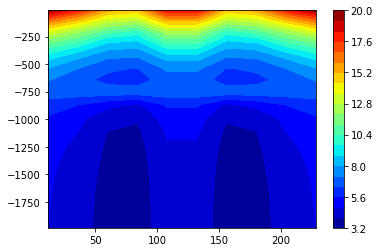

In [359]:
plt.contourf(data6D.yt/1000,data6D.zt,data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt")*100**2, 20, cmap="jet")
plt.colorbar()

# 3D Plots with Mayavi

In [ ]:
from mayavi import mlab
import numpy as np

In [346]:
data6D.E

<xarray.DataArray 'E' (Time: 17, mt: 20, lt: 20, kt: 20, zt: 20, yt: 10, xt: 1)>
[27200000 values with dtype=float64]
Coordinates:
  * Time     (Time) float64 0.0 1e+03 2e+03 3e+03 ... 1.4e+04 1.5e+04 1.6e+04
  * xt       (xt) float64 1.2e+05
  * yt       (yt) float64 1.2e+04 3.6e+04 6e+04 ... 1.8e+05 2.04e+05 2.28e+05
  * zt       (zt) float64 -1.985e+03 -1.832e+03 -1.683e+03 ... -48.33 -12.67
  * kt       (kt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * lt       (lt) float64 -0.01797 -0.01508 -0.01236 ... 0.01236 0.01508 0.01797
  * mt       (mt) float64 -0.08987 -0.0754 -0.06178 ... 0.06178 0.0754 0.08987
Attributes:
    long_name:  energy density          
    units:      m^5/s^2

In [1]:
x = data6D.E.mt
y = data6D.E.lt
z = data6D.E.kt

X, Y, Z = np.meshgrid(x, y, z)

s = data6D.E[-1,:,:,:,:,:,:].integrate("mt").integrate("lt").integrate("kt").T.values
mlab.volume_slice(s, plane_orientation='x_axes', slice_index=10)
mlab.axes()
mlab.show()

NameError: name 'data6D' is not defined

In [18]:
data6D.E[-1,:,:,:,0,0,0].min()

<xarray.DataArray 'E' ()>
array(4.60875729e-45)
Coordinates:
    Time     float64 8.3e+04
    xt       float64 1.2e+05
    yt       float64 1.2e+04
    zt       float64 -1.985e+03

In [29]:
x = data6D.E.xt
y = data6D.E.yt
z = data6D.E.zt

X, Y, Z = np.meshgrid(x, y, z)

s = data6D.E[-1,:,:,:,:,:,:].integrate("mt").integrate("lt").integrate("kt").T.values
b1 = np.percentile(s, 0)
b2 = np.percentile(s, 100)
mlab.pipeline.volume(mlab.pipeline.scalar_field(s), vmin=b1, vmax=b2)
mlab.axes()
mlab.show()

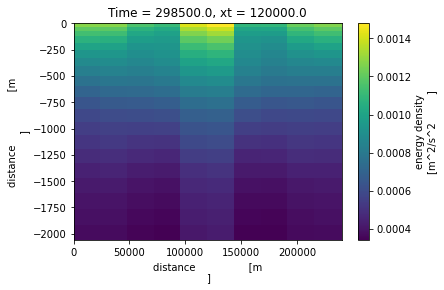

In [195]:
data3D.E[-1,:,:,0].plot()

([<matplotlib.axis.XTick at 0x7f2701cf2670>,
 [Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, '')])

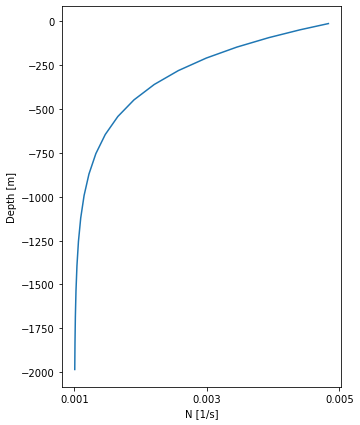

In [186]:
plt.figure(figsize=(5,7))
plt.plot(data3D.Nsqr[:,0,0]**0.5,data3D.zt)
plt.xlabel("N [1/s]")
plt.ylabel("Depth [m]")
plt.xticks([0.001,0.003,0.005])

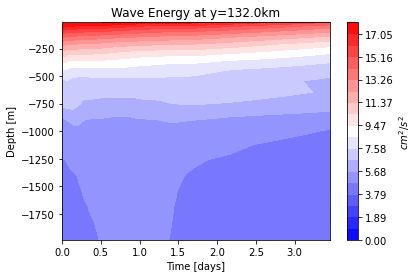

In [360]:
plt.contourf(data3D.Time/(60*60*24),data3D.zt,(data3D.E[:,:,5,0]*100**2).T,np.linspace(0,0.0018*100**2,20))
plt.xlabel("Time [days]")
plt.ylabel("Depth [m]")
plt.title("Wave Energy at y="+str(data3D.yt[5].values/1000)+"km")
plt.colorbar(label="$cm^{2}/s^{2}$")

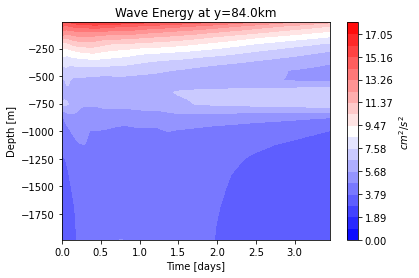

In [361]:
plt.contourf(data3D.Time/(60*60*24),data3D.zt,(data3D.E[:,:,3,0]*100**2).T,np.linspace(0,0.0018*100**2,20))
plt.xlabel("Time [days]")
plt.ylabel("Depth [m]")
plt.title("Wave Energy at y="+str(data3D.yt[3].values/1000)+"km")
plt.colorbar(label="$cm^{2}/s^{2}$")

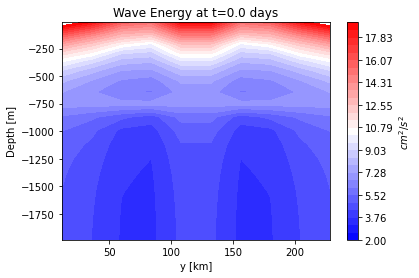

In [365]:

plt.contourf(data3D.yt/1000,data3D.zt,(data3D.E[0,:,:,0]*100**2),np.linspace(2,19,30))
plt.xlabel("y [km]")
plt.ylabel("Depth [m]")
plt.title("Wave Energy at t="+str(data3D.Time[0].values)+" days")
plt.colorbar(label="$cm^{2}/s^{2}$")

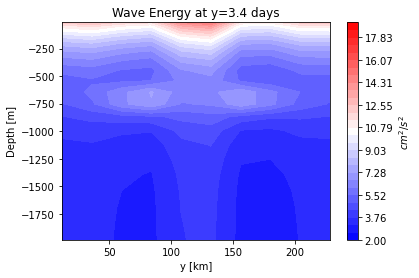

In [364]:
plt.contourf(data3D.yt/1000,data3D.zt,(data3D.E[-1,:,:,0]*100**2),np.linspace(2,19,30))
plt.xlabel("y [km]")
plt.ylabel("Depth [m]")
plt.title("Wave Energy at y="+str(data3D.Time[-1].values/(60*60*24))[:3]+" days")
plt.colorbar(label="$cm^{2}/s^{2}$")

In [ ]:
data6D.E[150,:,5,10,:,5,0].T.plot()

In [ ]:
plt.contourf(data3D.yt/1000,data3D.zt,(data3D.E[-1,:,:,0]*100**2),np.linspace(2,19,30))

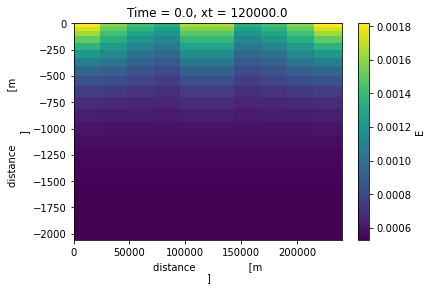

In [110]:
data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").plot()

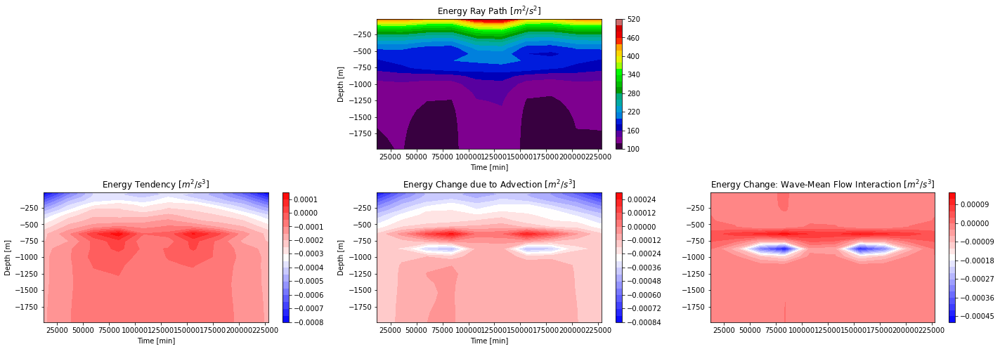

In [389]:
plt.figure(figsize=(20,10),tight_layout=True)
ax = plt.subplot(3,3,2)
ax.set_title("Energy Ray Path [$m^{2}/s^{2}$]")
co=ax.contourf(data3D.E.yt,data3D.E.zt[:],data3D.E[:,:,:,0].integrate("Time"),cmap="nipy_spectral",levels=21)
plt.colorbar(co)
ax.set_ylabel("Depth [m]")
ax.set_xlabel("Time [min]")

ax0 = plt.subplot(3,3,4)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D = data3D.E[:,:,:,0].differentiate("Time").integrate("Time")
co0=ax0.contourf(data3D.yt, data3D.zt[:], dE_6D[:,:],cmap="bwr",levels=21)
plt.colorbar(co0)
ax0.set_title("Energy Tendency [$m^{2}/s^{3}$]")
ax0.set_ylabel("Depth [m]")
ax0.set_xlabel("Time [min]")
         
ax1 = plt.subplot(3,3,5)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D_array2 = (data3D.E[:,:,:,0].differentiate("Time")+ data3D.meanfl[:,:,:,0]).integrate("Time")
co1=ax1.contourf(data3D.yt, data3D.zt[:], dE_6D_array2[:,:],cmap="bwr",levels=20)
plt.colorbar(co1)
ax1.set_title("Energy Change due to Advection [$m^{2}/s^{3}$]")
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")

#interaction of wave with mean flow
ax2 = plt.subplot(3,3,6)
ax2.set_title("Energy Change: Wave-Mean Flow Interaction [$m^{2}/s^{3}$]")
co3=ax2.contourf(data3D.E.yt,data3D.E.zt[:],data3D.meanfl[:,:,:,0].integrate("Time"),cmap="bwr",levels=20)
plt.colorbar(co3)
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")
plt.show()
#plt.savefig('ray_critical.png')

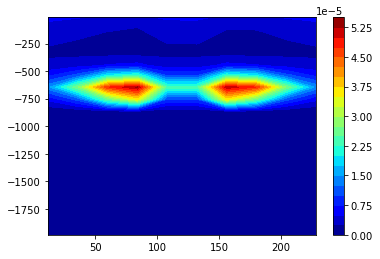

In [286]:
Kb=(0.2/(1+0.2)*(-data3D.diss_ms[-1,:,:,0])/data3D.Nsqr[:,:,0])
plt.contourf(data3D.yt/1000,data3D.zt,Kb,cmap="jet",levels=21)
plt.colorbar()

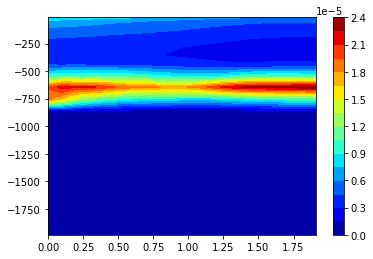

In [287]:
Kb=(0.2/(1+0.2)*(-data3D.diss_ms[:,:,5,0])/data3D.Nsqr[:,0,0])
plt.contourf(data3D.Time/(60*60*24),data3D.zt,Kb.T,cmap="jet",levels=20)
plt.colorbar()


<xarray.DataArray 'yt' ()>
array(84.)
Coordinates:
    yt       float64 8.4e+04

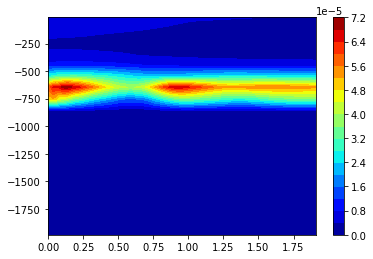

In [288]:
Kb=(0.2/(1+0.2)*(-data3D.diss_ms[:,:,3,0])/data3D.Nsqr[:,0,0])
plt.contourf(data3D.Time/(60*60*24),data3D.zt,Kb.T,cmap="jet",levels=20)
plt.colorbar()
data3D.yt[3]/1000

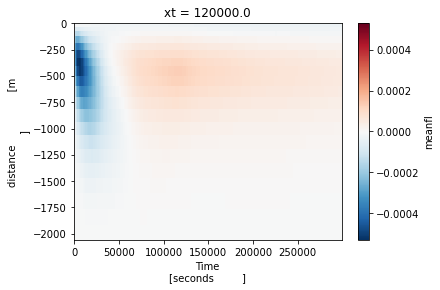

In [184]:
data3D.meanfl[:,:,:,0].integrate("yt").T.plot()

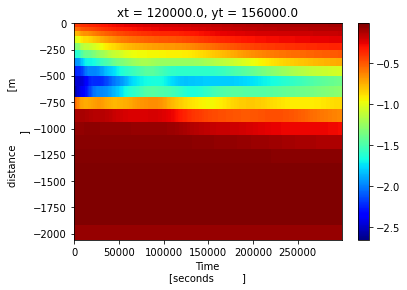

In [92]:
(0.2/(1+0.2)*data3D.diss_ms[:,:,6,0]/data3D.Nsqr[:,6,0]**2).T.plot(cmap="jet")

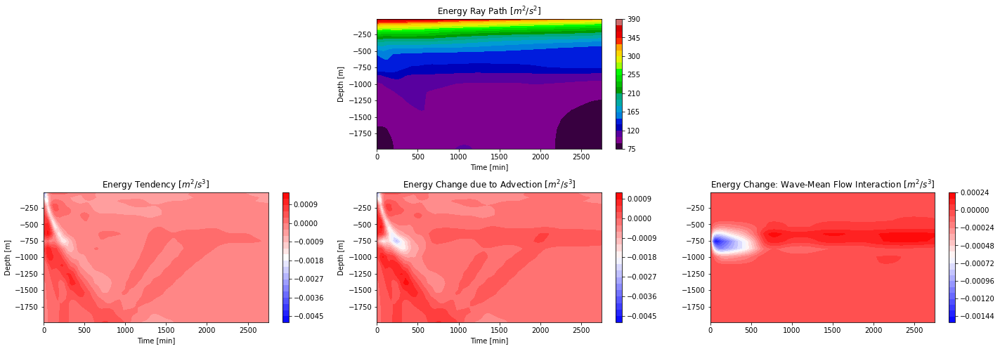

In [289]:
plt.figure(figsize=(20,10),tight_layout=True)
ax = plt.subplot(3,3,2)
ax.set_title("Energy Ray Path [$m^{2}/s^{2}$]")
co=ax.contourf(data3D.E.Time/60,data3D.E.zt[:],data3D.E[:,:,:,0].integrate("yt").T,cmap="nipy_spectral",levels=21)
plt.colorbar(co)
ax.set_ylabel("Depth [m]")
ax.set_xlabel("Time [min]")

ax0 = plt.subplot(3,3,4)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D = data3D.E[:,:,:,0].differentiate("Time").integrate("yt").T
co0=ax0.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D[:,:],cmap="bwr",levels=21)
plt.colorbar(co0)
ax0.set_title("Energy Tendency [$m^{2}/s^{3}$]")
ax0.set_ylabel("Depth [m]")
ax0.set_xlabel("Time [min]")
         
ax1 = plt.subplot(3,3,5)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D_array2 = (data3D.E[:,:,:,0].differentiate("Time")+ data3D.meanfl[:,:,:,0]).integrate("yt").T
co1=ax1.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D_array2[:,:],cmap="bwr",levels=20)
plt.colorbar(co1)
ax1.set_title("Energy Change due to Advection [$m^{2}/s^{3}$]")
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")

#interaction of wave with mean flow
ax2 = plt.subplot(3,3,6)
ax2.set_title("Energy Change: Wave-Mean Flow Interaction [$m^{2}/s^{3}$]")
co3=ax2.contourf(data3D.E.Time/60,data3D.E.zt[:],data3D.meanfl[:,:,:,0].integrate("yt").T,cmap="bwr",levels=20)
plt.colorbar(co3)
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")
plt.show()
#plt.savefig('ray_critical.png')

MemoryError: Unable to allocate 2.26 GiB for an array with shape (200, 19, 20, 20, 20, 10) and data type float64

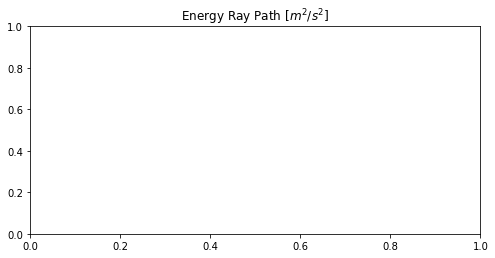

In [10]:
plt.figure(figsize=(20,10),tight_layout=True)
ax = plt.subplot(3,3,2)
ax.set_title("Energy Ray Path [$m^{2}/s^{2}$]")
co=ax.contourf(data6D.E.Time/60,data6D.E.zt[:],data6D.E[:,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").integrate("yt").T,cmap="nipy_spectral",levels=21)
plt.colorbar(co)
ax.set_ylabel("Depth [m]")
ax.set_xlabel("Time [min]")

ax0 = plt.subplot(3,3,4)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D = data6D.E[:,:,:,:,:,:,0].differentiate("Time").integrate("mt").integrate("lt").integrate("kt").integrate("yt").T
co0=ax0.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D[:,:],cmap="bwr",levels=np.linspace(-0.002,0.002,21))
plt.colorbar(co0)
ax0.set_title("Energy Tendency [$m^{2}/s^{3}$]")
ax0.set_ylabel("Depth [m]")
ax0.set_xlabel("Time [min]")
         
ax1 = plt.subplot(3,3,5)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D_array2 = (data6D.E[:,:,:,:,:,:,0].differentiate("Time")+ data6D.meanfl[:,:,:,:,:,:,0]).integrate("mt").integrate("lt").integrate("kt").integrate("yt").T
co1=ax1.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D_array2[:,:],cmap="bwr",levels=20)
plt.colorbar(co1)
ax1.set_title("Energy Change due to Advection [$m^{2}/s^{3}$]")
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")

#interaction of wave with mean flow
ax2 = plt.subplot(3,3,6)
ax2.set_title("Energy Change: Wave-Mean Flow Interaction [$m^{2}/s^{3}$]")
co3=ax2.contourf(data6D.E.Time/60,data6D.E.zt[:],data6D.meanfl[:,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").integrate("yt").T,cmap="bwr",levels=20)
plt.colorbar(co3)
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")
plt.show()
#plt.savefig('ray_critical.png')

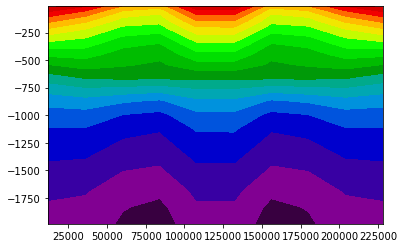

In [14]:
plt.contourf(data6D.E.yt,data6D.E.zt[:],data6D.E[-1,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt"),cmap="nipy_spectral", levels=20)

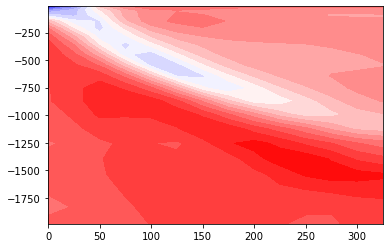

In [15]:
plt.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D_array2[:,:],cmap="bwr",levels=20)


TypeError: Length of x (111) must match number of columns in z (112)

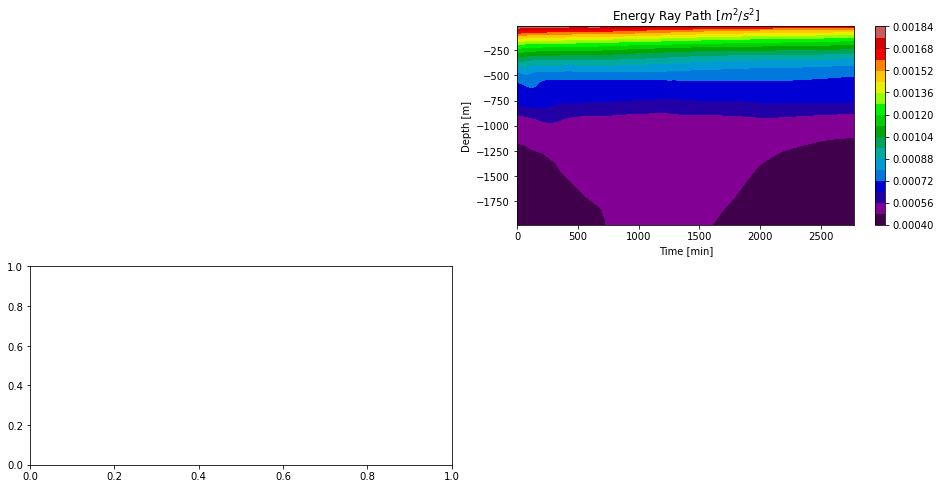

In [290]:
plt.figure(figsize=(20,10),tight_layout=True)
ax = plt.subplot(3,3,2)
ax.set_title("Energy Ray Path [$m^{2}/s^{2}$]")
co=ax.contourf(data6D.E.Time/60,data6D.E.zt[:],data6D.E[:,:,:,:,:,4,0].integrate("mt").integrate("lt").integrate("kt").T,cmap="nipy_spectral",levels=21)
plt.colorbar(co)
ax.set_ylabel("Depth [m]")
ax.set_xlabel("Time [min]")

ax0 = plt.subplot(3,3,4)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D = data6D.E[:,:,:,:,:,4,0].differentiate("Time").integrate("mt").integrate("lt").integrate("kt").T
co0=ax0.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D[:,:],cmap="bwr",levels=20)
plt.colorbar(co0)
ax0.set_title("Energy Tendency [$m^{2}/s^{3}$]")
ax0.set_ylabel("Depth [m]")
ax0.set_xlabel("Time [min]")
         
ax1 = plt.subplot(3,3,5)
#change of energy along the wave trajectory
# Edot=dE/dt = del_t(E)+zdot*del_z(E) = E*wdot/w - E*del_z(zdot) = meanfl - E(del_N(zdot)*del_z(N) + del_w(zdot)del_z(w))
dE_6D_array2 = (data6D.E[:,:,:,:,:,4,0].differentiate("Time")+ data6D.meanfl[:,:,:,:,:,4,0]).integrate("mt").integrate("lt").integrate("kt").T
co1=ax1.contourf(data3D.Time[:]/60, data3D.zt[:], dE_6D_array2[:,:],cmap="bwr",levels=20)
plt.colorbar(co1)
ax1.set_title("Energy Change due to Advection [$m^{2}/s^{3}$]")
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")

#interaction of wave with mean flow
ax2 = plt.subplot(3,3,6)
ax2.set_title("Energy Change: Wave-Mean Flow Interaction [$m^{2}/s^{3}$]")
co3=ax2.contourf(data6D.E.Time/60,data6D.E.zt[:],data6D.meanfl[:,:,:,:,:,4,0].integrate("mt").integrate("lt").integrate("kt").T,cmap="bwr",levels=20)
plt.colorbar(co3)
ax1.set_ylabel("Depth [m]")
ax1.set_xlabel("Time [min]")

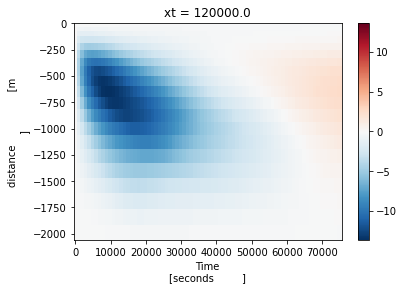

In [391]:
delta=0.2

Kb=delta/(1+delta) * (data6D.meanfl[:,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt")/data3D.Nsqr[:,:,0]).integrate("yt").T
Kb.plot()

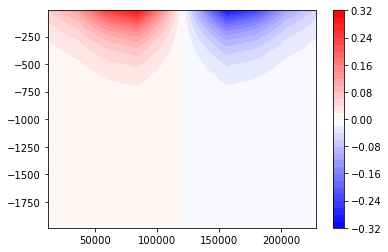

In [140]:
plt.contourf(data3D.U.yt,data3D.U.zt,data3D.U[:,:,0],30)
plt.colorbar()

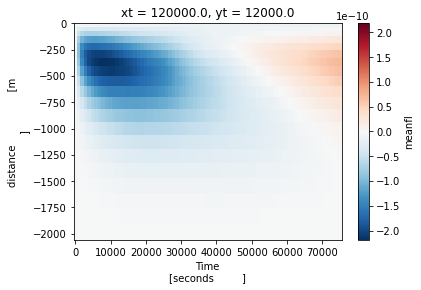

In [392]:
data6D.meanfl[:,:,:,:, :,0,0].integrate("mt").integrate("lt").integrate("kt").T.plot()

# Video

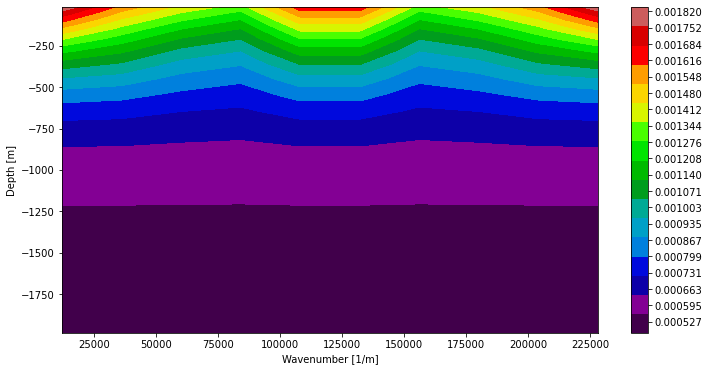

In [144]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(12,6))
ax = plt.axes(xlabel="x",ylabel="y")
cm = "nipy_spectral"
cax=plt.contourf(data6D.E.yt,data6D.E.zt[:],data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt"),cmap=cm,levels=20)
ax.set_xlabel("Wavenumber [1/m]")
ax.set_ylabel("Depth [m]")
cbar=plt.colorbar(cax)
arr=data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").values
vmax=np.max(arr)
vmin=np.min(arr)
cbar_ticks=np.linspace(vmin,vmax,20)
cbar.set_ticks(cbar_ticks)
plt.show()
def animate2(i):
    
    arr=data6D.E[i,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").values
    vmax=np.max(arr)
    vmin=np.min(arr)
    cax=ax.contourf(data6D.E.yt,data6D.E.zt[:],arr,cmap=cm,levels=20)
    cbar_ticks=np.linspace(vmin,vmax,20)
    cbar.set_ticks(cbar_ticks)
    ax.set_title("t = "+ str((data6D.Time[i].values/60).round(0)))
    plt.draw()
anim = animation.FuncAnimation(fig,animate2,frames=len(data6D.E[:,0,0,0,0,0,0])-1, interval=50)


<ipython-input-467-6433ce00c580>:7: UserWarning: The following kwargs were not used by contour: 'add_colorbar'
  cax=plt.contourf(data6D.E.yt,data6D.E.zt[:],data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt"),cmap=cm,add_colorbar=True,levels=np.linspace(0.,0.002,20))


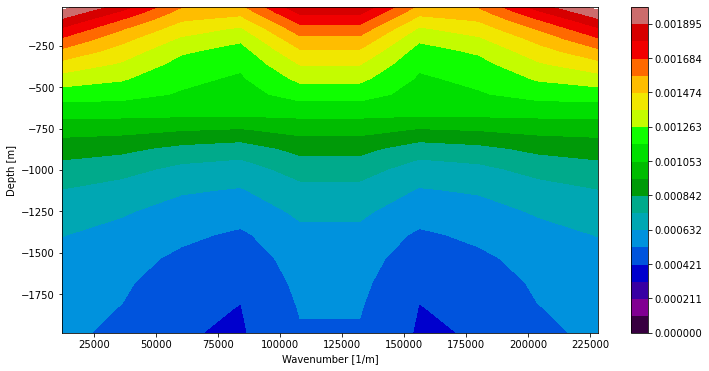

In [467]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(12,6))
ax = plt.axes(xlabel="x",ylabel="y")
cm = "nipy_spectral"
cax=plt.contourf(data6D.E.yt,data6D.E.zt[:],data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt"),cmap=cm,add_colorbar=True,levels=np.linspace(0.,0.002,20))
ax.set_xlabel("Wavenumber [1/m]")
ax.set_ylabel("Depth [m]")
cbar= plt.colorbar(cax)
def animate2(i):
    arr=data6D.E[i,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").values
    vmax=np.max(arr)
    vmin=np.min(arr)
    levels=np.linspace(vmin,vmax,20)
    cax.set_array(arr)
    
    ax.set_title("t = "+ str((data6D.Time[i].values/60).round(0)))
anim = animation.FuncAnimation(fig,animate2,frames=len(data6D.E[:,0,0,0,0,0,0])-1, interval=50)


NameError: name 'cbar_ticks' is not defined

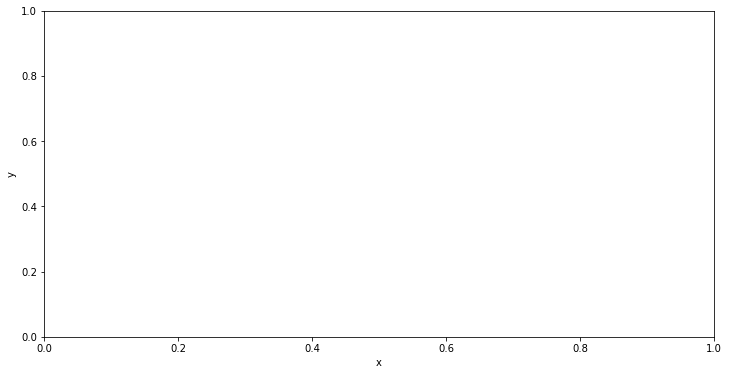

In [143]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(12,6))
ax = plt.axes(xlabel="x",ylabel="y")
cm = "nipy_spectral"
cax=plt.contourf(data6D.E.yt,data6D.E.zt[:],data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt"),cmap=cm,levels=cbar_ticks)
ax.set_xlabel("Wavenumber [1/m]")
ax.set_ylabel("Depth [m]")
cbar=plt.colorbar(cax)
arr=data6D.E[0,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").values
vmax=np.max(arr)
vmin=np.min(arr)
cbar_ticks=np.linspace(vmin,vmax,20)

def animate2(i):
    
    arr=data6D.E[i,:,:,:,:,:,0].integrate("mt").integrate("lt").integrate("kt").values

    cax=ax.contourf(data6D.E.yt,data6D.E.zt[:],arr,cmap=cm,levels=cbar_ticks)
    ax.set_title("t = "+ str((data6D.Time[i].values/60).round(0)))

anim = animation.FuncAnimation(fig,animate2,frames=len(data6D.E[:,0,0,0,0,0,0])-1, interval=50)


In [145]:
HTML(anim.to_jshtml())

<Figure size 432x288 with 0 Axes>

In [156]:
anim.save("ray_critical.gif")

MovieWriter ffmpeg unavailable; using Pillow instead.


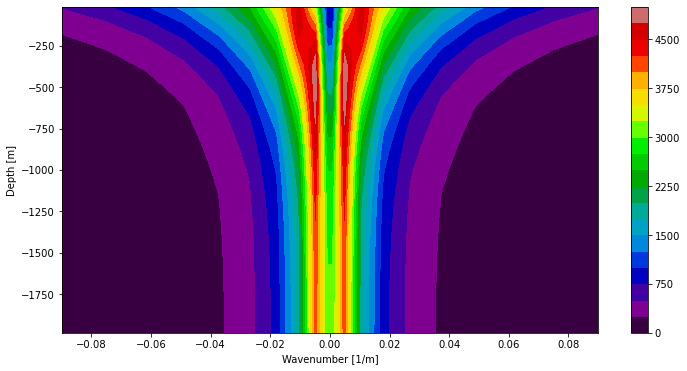

In [141]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(12,6))
ax = plt.axes(xlabel="x",ylabel="y")
cm = "nipy_spectral"
cax=plt.contourf(data6D.E.mt,data6D.E.zt[:],data6D.E[0,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T,cmap=cm,levels=21)
ax.set_xlabel("Wavenumber [1/m]")
ax.set_ylabel("Depth [m]")
cbar=plt.colorbar(cax)


def animate2(i):
    
    arr=data6D.E[i,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T.values

    cax=ax.contourf(data6D.E.mt,data6D.E.zt[:],arr,cmap=cm,levels=21)
    ax.set_title("t = "+ str((data6D.Time[i].values/60).round(0)))

anim = animation.FuncAnimation(fig,animate2,frames=len(data6D.E[:,0,0,0,0,0,0])-1, interval=50)


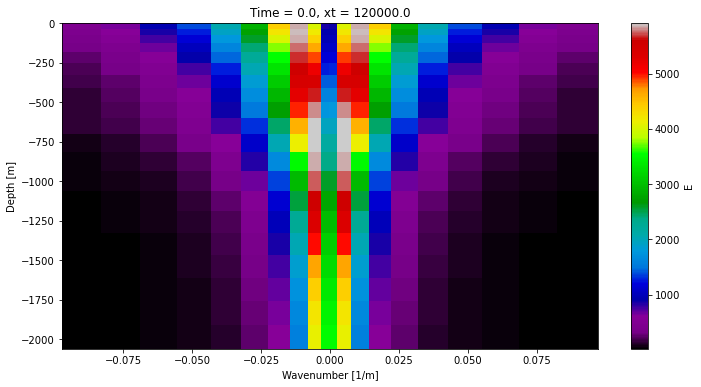

In [165]:
import matplotlib.animation as animation
from IPython.display import HTML, display

fig = plt.figure(figsize=(12,6))
ax = plt.axes(xlabel="x",ylabel="y")
cm = "nipy_spectral"
cax=data6D.E[0,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T.plot(cmap=cm,add_colorbar=True,cbar_kwargs={'extend':'neither'})
ax.set_xlabel("Wavenumber [1/m]")
ax.set_ylabel("Depth [m]")
def animate2(i):
    arr=data6D.E[i,:,:,:,:,:,0].integrate("kt").integrate("lt").integrate("yt").T.values
    vmax=np.max(arr)
    vmin=np.min(arr)
    cax.set_array(arr)
    cax.set_clim(vmin,vmax)
    ax.set_title("t = "+ str((data6D.Time[i].values/60).round(0)))

In [172]:
anim = animation.FuncAnimation(fig,animate2,frames=len(data6D.E[:,0,0,0,0,0,0])-1, interval=50)


In [142]:
HTML(anim.to_jshtml())

# Friedericke  Pollman

In [292]:
slope= [ 1.73879621, 1.59841674, 1.6260668 ,1.84672684 ,1.5620908, 1.69406136 ,1.64638051 ,1.65678645, 1.8364707 ,1.9917022, 1.92552799]
m = [ 0.00358464, 0.00152963, 0.00381711 ,0.00716132 ,0.0009773 ,0.0032994 ,0.00213355 ,0.00219087, 0.00594029 ,0.01282588 ,0.00860673]
E = [ 0.00152891 ,0.00150103, 0.00125526, 0.00095954 ,0.00102083 ,0.00093028 ,0.00094964, 0.00095635 ,0.00073936 ,0.00064744 ,0.00050696]
depth = np.arange(300,1400,100)


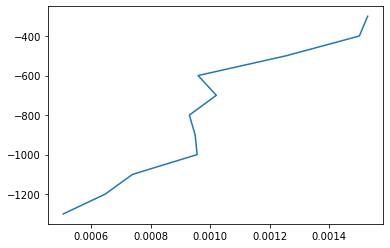

In [296]:
plt.plot(E,-depth)

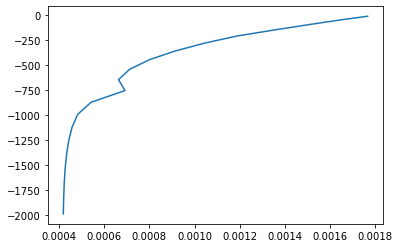

In [314]:
plt.plot(data3D.E[0,:,:,0].mean("yt"),data3D.zt[:])

In [307]:
data3D.E[0,:,0,0].zt[4:-6]

<xarray.DataArray 'zt' (zt: 10)>
array([-1393.015478, -1254.165426, -1120.959539,  -992.469839,  -870.52796 ,
        -754.138479,  -645.078802,  -542.308615,  -447.567404,  -359.782248])
Coordinates:
    Time     float64 0.0
    xt       float64 1.2e+05
    yt       float64 1.2e+04
  * zt       (zt) float64 -1.393e+03 -1.254e+03 -1.121e+03 ... -447.6 -359.8
Attributes:
    long_name:  distance                
    units:      m